<a href="https://colab.research.google.com/github/RAseng77/AIFFEL_QUEST_RS/blob/master/GoingDeeper/GD03/semantic_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install albumentations

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 MB 100.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 583.0/583.0 kB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 84.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5/5 [albumentations]m [albumentations]eadless]


In [ ]:
#필요한 라이브러리를 로드합니다.
import os
import math
import numpy as np
import torch
import torchvision.transforms as transforms

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

import torch.nn as nn
import torch.optim as optim

print('=3')

=3


In [ ]:
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train = True):
    if is_train: # 훈련 데이터인 경우
        return Compose([
            HorizontalFlip(p=0.5), # 50%확률로 좌우 대칭
            RandomSizedCrop(
                min_max_height=(300, 370),
                w2h_ratio=370/1242,
                hegiht=224,
                width=224,
                size=(224, 224),
                p=0.5
            ),
        Resize(
            width=224,
            height=224
        )
        ])

    return Compose([
        Resize(
            width=224,
            height=224
        )
    ])

/tmp/ipykernel_91/1565998641.py:7: UserWarning: Argument(s) 'hegiht, width' are not valid for transform RandomSizedCrop
  RandomSizedCrop(


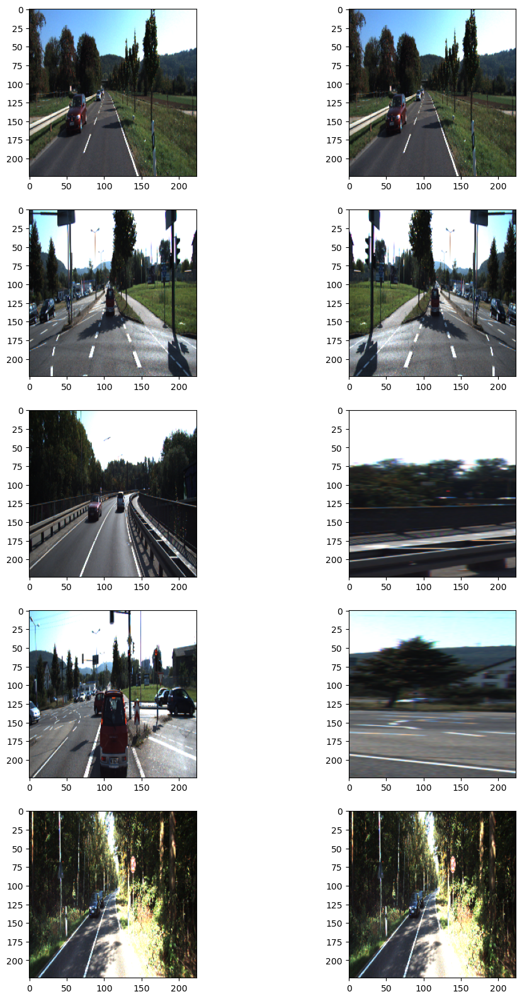

In [ ]:
data_dir = os.path.join(os.getenv("HOME"), "work/semantic_segmentation/data/training")

augmentation_train = build_augmentation()
augmentation_test = build_augmentation(is_train=False)
input_image = glob(os.path.join(data_dir, "image_2", "*.png"))

plt.figure(figsize=(12,20))
for i in range(5):
    image = imread(input_image[i])
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지

plt.show()

In [ ]:
from torch.utils.data import Dataset

class KittiDataset(Dataset):
    def __init__(self,
                dir_path,
                img_size=(224, 224, 3),
                output_size=(224,224),
                is_train=True,
                augmentation=None):
        self.dir_path = dir_path
        self.is_train = is_train
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

        # load_dataset()을 통해 kitti dataset의 경로에서 라벨과 이미지를 확인함
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수
        input_images = sorted(glob(os.path.join(self.dir_path, "image_2", "*.png")))
        label_images = sorted(glob(os.path.join(self.dir_path, "semantic", "*.png")))

        assert len(input_images) == len(label_images)
        data = list(zip(input_images, label_images))

        if self.is_train:
            return data[:-30]
        return data[-30:]

    def __len__(self):
        # Dataset의 length로서 전체 dataset 크기를 반환합니다.
        return len(self.data)

    def __getitem__(self, index):
        # 입력과 출력을 만듭니다.
        # 입력은 resize 및 augmentation이 적용된 input image이고
        # 출력은 semantic label입니다.
        input_image_path, output_path = self.data[index]

        _input = imread(input_image_path)
        _output = imread(output_path)

        # 특정 라벨을 이진 마스크로 변환
        _output = (_output == 7).astype(np.uint8) * 1

        data = {
            "image": _input,
            "mask": _output,
        }

        if self.augmentation:
            augmented = self.augmentation(**data)
            _input = augmented["image"] / 255.0
            _output = augmented["mask"]

        _output = np.expand_dims(_output, axis=0)

        return (
            torch.tensor(_input, dtype=torch.float32).permute(2, 0, 1),  # (H, W, C) → (C, H, W)
            torch.tensor(_output, dtype=torch.float32)  # (1, H, W) 형식 유지
        )

    def shuffle_data(self):
        if self.is_train:
            np.random.shuffle(self.data)

In [ ]:
from torch.utils.data import DataLoader

# Augmentation 설정

augmentation = build_augmentation()
test_preproc = build_augmentation(is_train=False)

train_dataset = KittiDataset(
    data_dir,
    augmentation=augmentation,
    is_train=True
)

test_dataset = KittiDataset(
    data_dir,
    augmentation=test_preproc,
    is_train=False
)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=True)

/tmp/ipykernel_91/1565998641.py:7: UserWarning: Argument(s) 'hegiht, width' are not valid for transform RandomSizedCrop
  RandomSizedCrop(


In [ ]:
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, input_channels=3, output_channels=1):
        super(UNet, self).__init__()

        # Contracting path (Encoder)
        self.enc1 = self.double_conv(input_channels, 64)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = self.double_conv(64, 128)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = self.double_conv(128, 256)
        self.pool3 = nn.MaxPool2d(2)
        self.enc4 = self.double_conv(256, 512)
        self.pool4 = nn.MaxPool2d(2)

        # Bottlenet
        self.bottleneck = self.double_conv(512, 1024)
        self.dropout = nn.Dropout(0.5)

        # Expanding Path (Decoder)
        self.up6 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.dec6 = self.double_conv(1024, 512)
        self.up7 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec7 = self.double_conv(512, 256)
        self.up8 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec8 = self.double_conv(256, 128)
        self.up9 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec9 = self.double_conv(128, 64)

        # Output layer
        self.final = nn.Conv2d(64, output_channels, kernel_size=1)

    def double_conv(self, in_channels, out_channels):
        """2개의 Conv Layer로 이루어진 블록"""
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        # Encoder
        c1 = self.enc1(x)
        p1 = self.pool1(c1)
        c2 = self.enc2(p1)
        p2 = self.pool2(c2)
        c3 = self.enc3(p2)
        p3 = self.pool3(c3)
        c4 = self.enc4(p3)
        p4 = self.pool4(c4)

        # Bottleneck
        c5 = self.bottleneck(p4)
        c5 = self.dropout(c5)

        # Decoder
        u6 = self.up6(c5)
        u6 = torch.cat([u6, c4], dim=1)
        c6 = self.dec6(u6)

        u7 = self.up7(c6)
        u7 = torch.cat([u7, c3], dim=1)
        c7 = self.dec7(u7)

        u8 = self.up8(c7)
        u8 = torch.cat([u8, c2], dim=1)
        c8 = self.dec8(u8)

        u9 = self.up9(c8)
        u9 = torch.cat([u9, c1], dim=1)
        c9 = self.dec9(u9)

        # Output
        output = torch.sigmoid(self.final(c9))
        return output

In [ ]:
%%time

# 모델 저장 경로
model_path = "./work/semantic_segmentation/seg_model_unet.pth"

# 모델 생성
model = UNet(input_channels=3, output_channels=1)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# 손실 함수 및 옵티마이저 설정
criterion = torch.nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# 데이터로더 준비
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# 모델 학습
num_epochs=100
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for inputs, targets in train_loader:
        inputs, targets = inputs.to(device), targets.to(device)

        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets.float()) # targets을 float 타입으로 변환
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {running_loss/len(train_loader)}")

torch.save(model.state_dict(), model_path)

Epoch 1/100, Loss: 0.711929050358859
Epoch 2/100, Loss: 0.6481321074745872
Epoch 3/100, Loss: 0.5863437706773932
Epoch 4/100, Loss: 0.5095589702779596
Epoch 5/100, Loss: 0.44322633743286133
Epoch 6/100, Loss: 0.37844061851501465
Epoch 7/100, Loss: 0.3345417217774825
Epoch 8/100, Loss: 0.33844702352177014
Epoch 9/100, Loss: 0.3134553649208762
Epoch 10/100, Loss: 0.27707184715704486
Epoch 11/100, Loss: 0.24717270650646903
Epoch 12/100, Loss: 0.2444399432702498
Epoch 13/100, Loss: 0.2206470478664745
Epoch 14/100, Loss: 0.23276944729414853
Epoch 15/100, Loss: 0.20979475297711112
Epoch 16/100, Loss: 0.22274417091499676
Epoch 17/100, Loss: 0.1936494396491484
Epoch 18/100, Loss: 0.1829712214795026
Epoch 19/100, Loss: 0.18953486735170538
Epoch 20/100, Loss: 0.19866512038490988
Epoch 21/100, Loss: 0.18428598615256223
Epoch 22/100, Loss: 0.21055808798833328
Epoch 23/100, Loss: 0.19023640318350357
Epoch 24/100, Loss: 0.19131221825426276
Epoch 25/100, Loss: 0.20844423093579031
Epoch 26/100, Loss: 

In [ ]:
model = UNet(input_channels=3, output_channels=1)
model.load_state_dict(torch.load(model_path, map_location=torch.device('cpu')))
model.eval

<bound method Module.eval of UNet(
  (enc1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (enc3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (en

In [ ]:
import matplotlib.pyplot as plt

def get_output(model, preproc, image_path, output_path):
    # 원본 이미지 로드
    origin_img = imread(image_path)
    data = {"image": origin_img}

    # 전처리 적용 (모델이 학습할 때 썼던 크기와 똑같이 리사이징)
    processed = preproc(**data)

    # 넘파이 배열을 파이토치 텐서로 변환
    input_tensor = torch.tensor(processed["image"] / 255.0, dtype=torch.float32).permute(2, 0, 1).unsqueeze(0)

    # 모델에게 "사진 속 도로가 어디야?"라고 물어본다 (추론단계)
    model.eval()
    with torch.no_grad():
        output = model(input_tensor)

    # 모델의 출력을 0 또는 255로 변환합니다
    output = (output[0].squeeze().numpy() > 0.5).astype(np.uint8) * 255

    # 넘파이 배열을 이미지 객체(PIL)로 변환합니다.
    output = Image.fromarray(output)

    # 원본 이미지 위에 모델이 예측한 마스크를 겹칩니다 (Overlay)
    # 배경 이미지를 RGBA(투명도 포함) 모드로 변환
    background = Image.fromarray(origin_img).convert('RGBA')

    # 마스크 크기를 원본 이미지 크기에 딱 맞게 조절한 후 RGBA로 변환
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')

    # 두 이미지를 50% 투명도로 섞습니다.
    blended = Image.blend(background, output, alpha=0.5)

    # 결과를 파일로 저장
    blended.save(output_path)

    # 화면에 결과를 띄웁니다.
    img_np = np.array(blended) # 시각화를 위해 다시 넘파이로 변환
    plt.imshow(img_np)
    plt.axis('off')
    plt.show()

    return blended

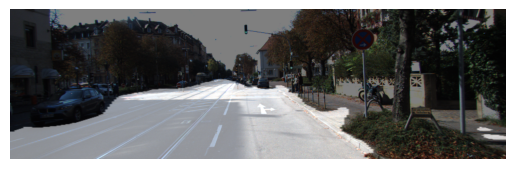

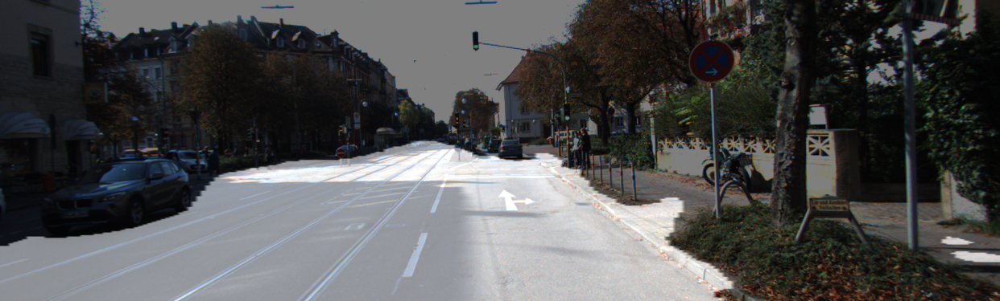

In [ ]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다.
get_output(
     model,
     test_preproc,
     image_path=data_dir + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=data_dir + f'/result_{str(i).zfill(3)}.png'
 )

In [ ]:
def calculate_iou_score(target, prediction):
    # 크기 맞추기
    # 정답과 예측값의 해상도가 다르면 비교가 불가능합니다.
    # 만약 다르면 예측값을 정답의 크기에 맞춰 강제로 리사이징합니다.
    if target.shape != prediction.shape:
        prediction = resize(prediction, target.shape, mode='constant', preserve_range=True).astype=(np.uint8)

    # 교집합 구하기
    # np.logical_and는 "둘 다 도로(1)라고 한 구역" 을 찾아냅니다.
    # .sum()을 통해 그 겹치는 픽셀들의 개수(면적)를 모두 더합니다.
    intersection = np.logical_and(target, prediction).sum()

    # 합집합 구하기
    # np.logical_or는 "정답이든 예측이든, 둘 중 하나라도 도로라고 한 구역"을 모두 합칩니다.
    # .sum()을 통해 그 전체 면적을 더합니다.
    union = np.logical_or(target, prediction).sum()

    # IoU 스코어 계산
    # 공식: 교집합 / 합집합
    # 1e-7은 '분모가 0'이 되는 대참사를 막기 위한 작은 안전장치입니다.
    iou_score = intersection / (union + 1e-7)

    # 결과 출력 및 반환
    print(f"IoU: {iou_score:.6f}")
    return iou_score

In [ ]:
def get_output(model, preproc, image_path, output_path, label_path=None):
    device = next(model.parameters()).device

    # 원본 이미지 로드 및 전처리
    origin_img = imread(image_path)
    data = {"image": origin_img}
    processed = preproc(**data) # 학습 때와 동일한 크기로 리사이징

    # 파이토치 텐서 변환 (정규화 + 차원변경 + 배치추가)
    input_tensor = torch.tensor(processed["image"] / 255.0, dtype=torch.float32)
    input_tensor = input_tensor.permute(2, 0, 1).unsqueeze(0).to(device)

    # 모델 추론
    model.eval()
    with torch.no_grad():
        output = model(input_tensor)

    # 예측 마스크 생성 (Threshold 0.5 적용)
    # 확률이 0.5보다 크면 255(흰색, 도로), 작으면 0(검은색, 배경)
    prediction = (output[0].squeeze().cpu().numpy() > 0.5).astype(np.uint8) * 255
    prediction = Image.fromarray(prediction).convert('L') # PIL 그레이스케일 이미지로 변환

    # 시각화용 블렌딩 (Overlay)
    background = Image.fromarray(origin_img).convert('RGBA')
    # 마스크를 원본 사진 크기에 맞게 다시 키웁니다.
    prediction_resized = prediction.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    # 원본과 예측 마스크를 50:50으로 합성합니다.
    blended = Image.blend(background, prediction_resized, alpha=0.5)

    # 결과 저장 및 출력
    blended.save(output_path)
    img_np = np.array(blended)
    plt.imshow(img_np)
    plt.axis('off')
    plt.show()

    # 정답지(Label) 처리 로직
    target = None
    if label_path:
        # 실제 정답 이미지를 불러옵니다.
        label_img = imread(label_path)
        label_data = {"image": label_img}
        # 이미지를 모델 입력 크기와 동일하게 전처리합니다.
        label_processed = preproc(**label_data)["image"]
        # KITTI 데이터셋의 '도로' 클래스인 7번만 1로 추출하여 '정답 마스크'를 만듭니다.
        target = (label_processed == 7).astype(np.uint8) * 1

    # 최종 결과물들 반환: (시각화 이미지, 예측 마스크 배열, 정답 마스크 배열)
    return blended, np.array(prediction), target

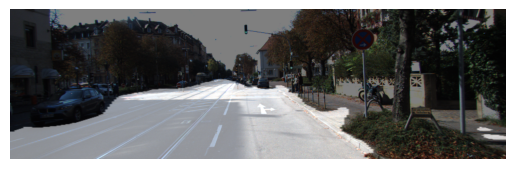

IoU: 0.885848


np.float64(0.8858480374441062)

In [ ]:
# 완성한 뒤에는 시각화한 결과를 눈으로 확인해봅시다!
i = 1    # i값을 바꾸면 테스트용 파일이 달라집니다.
output, prediction, target = get_output(
     model,
     test_preproc,
     image_path=data_dir + f'/image_2/00{str(i).zfill(4)}_10.png',
     output_path=data_dir + f'/result_{str(i).zfill(3)}.png',
     label_path=data_dir + f'/semantic/00{str(i).zfill(4)}_10.png'
 )

calculate_iou_score(target, prediction)

In [ ]:
class VGGBlock(nn.Module):
    def __init__(self, in_channels, middle_channels, out_channels):
        super().__init__()
        self.relu = nn.ReLU(inplace=True)
        self.conv1 = nn.Conv2d(in_channels, middle_channels, 3, padding=1)
        self.bn1 = nn.BatchNorm2d(middle_channels)
        self.conv2 = nn.Conv2d(middle_channels, out_channels, 3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_channels)

    def forward(self, x):
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        return out

class UNetPlusPlus(nn.Module):
    def __init__(self, num_classes=1, input_channels=3, deep_supervision=False):
        super().__init__()
        self.deep_supervision = deep_supervision
        nb_filter = [32, 64, 128, 256, 512] # 각 층의 필터 개수

        self.pool = nn.MaxPool2d(2, 2)
        self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)

        # 인코더
        self.conv0_0 = VGGBlock(input_channels, nb_filter[0], nb_filter[0])
        self.conv1_0 = VGGBlock(nb_filter[0], nb_filter[1], nb_filter[1])
        self.conv2_0 = VGGBlock(nb_filter[1], nb_filter[2], nb_filter[2])
        self.conv3_0 = VGGBlock(nb_filter[2], nb_filter[3], nb_filter[3])
        self.conv4_0 = VGGBlock(nb_filter[3], nb_filter[4], nb_filter[4])

        # 중첩된 노드들
        # X_0,1
        self.conv0_1 = VGGBlock(nb_filter[0] + nb_filter[1], nb_filter[0], nb_filter[0])

        # X_1,1 / X_0,2
        self.conv1_1 = VGGBlock(nb_filter[1] + nb_filter[2], nb_filter[1], nb_filter[1])
        self.conv0_2 = VGGBlock(nb_filter[0]*2 + nb_filter[1], nb_filter[0], nb_filter[0])

        # X_2,1 / X_1,2 / X_0,3
        self.conv2_1 = VGGBlock(nb_filter[2] + nb_filter[3], nb_filter[2], nb_filter[2])
        self.conv1_2 = VGGBlock(nb_filter[1]*2 + nb_filter[2], nb_filter[1], nb_filter[1])
        self.conv0_3 = VGGBlock(nb_filter[0]*3 + nb_filter[1], nb_filter[0], nb_filter[0])

        # X_3,1 / X_2,2 / X_1,3 / X_0,4
        self.conv3_1 = VGGBlock(nb_filter[3] + nb_filter[4], nb_filter[3], nb_filter[3])
        self.conv2_2 = VGGBlock(nb_filter[2]*2 + nb_filter[3], nb_filter[2], nb_filter[2])
        self.conv1_3 = VGGBlock(nb_filter[1]*3 + nb_filter[2], nb_filter[1], nb_filter[1])
        self.conv0_4 = VGGBlock(nb_filter[0]*4 + nb_filter[1], nb_filter[0], nb_filter[0])

        # 최종 출력 레이어
        if self.deep_supervision:
            self.final1 = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)
            self.final2 = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)
            self.final3 = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)
            self.final4 = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)
        else:
            self.final = nn.Conv2d(nb_filter[0], num_classes, kernel_size=1)

    def forward(self, input):
        # 인코더
        x0_0 = self.conv0_0(input)
        x1_0 = self.conv1_0(self.pool(x0_0))

        # Nested Skip
        x0_1 = self.conv0_1(torch.cat([x0_0, self.up(x1_0)], 1))

        x2_0 = self.conv2_0(self.pool(x1_0))
        x1_1 = self.conv1_1(torch.cat([x1_0, self.up(x2_0)], 1))
        x0_2 = self.conv0_2(torch.cat([x0_0, x0_1, self.up(x1_1)], 1))

        x3_0 = self.conv3_0(self.pool(x2_0))
        x2_1 = self.conv2_1(torch.cat([x2_0, self.up(x3_0)], 1))
        x1_2 = self.conv1_2(torch.cat([x1_0, x1_1, self.up(x2_1)], 1))
        x0_3 = self.conv0_3(torch.cat([x0_0, x0_1, x0_2, self.up(x1_2)], 1))

        x4_0 = self.conv4_0(self.pool(x3_0))
        x3_1 = self.conv3_1(torch.cat([x3_0, self.up(x4_0)], 1))
        x2_2 = self.conv2_2(torch.cat([x2_0, x2_1, self.up(x3_1)], 1))
        x1_3 = self.conv1_3(torch.cat([x1_0, x1_1, x1_2, self.up(x2_2)], 1))
        x0_4 = self.conv0_4(torch.cat([x0_0, x0_1, x0_2, x0_3, self.up(x1_3)], 1))

        if self.deep_supervision:
            out1 = self.final1(x0_1)
            out2 = self.final2(x0_2)
            out3 = self.final3(x0_3)
            out4 = self.final4(x0_4)
            return [out1, out2, out3, out4]
        else:
            return self.final(x0_4)

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

# GPU(또는 MPS, CPU) 설정
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"학습 장치: {device}")

# U-Net++ 모델 생성 및 장치 할당
model_unetplus = UNetPlusPlus(input_channels=3, num_classes=1, deep_supervision=False).to(device)

# 손실 함수와 최적화 도구 설정 (U-Net 학습 때와 동일하게 맞추는 것이 공정합니다!)
criterion = nn.BCEWithLogitsLoss() # 0과 1로 구분하는 이진 세그맨테이션의 표준
optimizer = optim.Adam(model_unetplus.parameters(), lr=1e-4)

epochs = 100 # 학습 횟수

print("U-Net++ 학습을 시작합니다!")

# 본격적인 학습 루프
for epoch in range(epochs):
    model_unetplus.train()
    epoch_loss = 0

    for batch_idx, (images, masks) in enumerate(train_loader): # train_loader는 기존 것을 사용
        images = images.to(device)
        masks = masks.to(device)

        # 기울기 초기화
        optimizer.zero_grad()

        # 순전파 (Forward)
        outputs = model_unetplus(images)

        # 오차(Loss) 계산
        if isinstance(outputs, list):
            # deep_supervision=True 인 경우: 4개의 출력물 Loss를 모두 더함
            loss = sum([criterion(out, masks) for out in outputs])
        else:
            # deep_supervision=False 인 경우: 단일 출력물 Loss 계산
            loss = criterion(outputs, masks)

        # 역전파 및 가중치 업데이트 (Backward & Optimize)
        loss.backward()
        optimizer.step()

        epoch_loss += loss.item()

    # 에포크마다 평균 Loss 출력
    avg_loss = epoch_loss / len(train_loader)
    print(f"Epoch [{epoch+1}/{epochs}] | Average Loss: {avg_loss:.4f}")

# 학습된 모델 가중치 저장
model_plus_path = './work/semantic_segmentation/seg_model_unetplus.pth'
torch.save(model_unetplus.state_dict(), model_plus_path)
print(f"✅ 학습 완료 및 가중치 저장 완료: {model_plus_path}")

학습 장치: cuda
U-Net++ 학습을 시작합니다!
Epoch [1/100] | Average Loss: 0.5388
Epoch [2/100] | Average Loss: 0.4446
Epoch [3/100] | Average Loss: 0.3933
Epoch [4/100] | Average Loss: 0.3790
Epoch [5/100] | Average Loss: 0.3704
Epoch [6/100] | Average Loss: 0.3589
Epoch [7/100] | Average Loss: 0.3582
Epoch [8/100] | Average Loss: 0.3368
Epoch [9/100] | Average Loss: 0.3440
Epoch [10/100] | Average Loss: 0.3403
Epoch [11/100] | Average Loss: 0.3450
Epoch [12/100] | Average Loss: 0.3325
Epoch [13/100] | Average Loss: 0.3274
Epoch [14/100] | Average Loss: 0.3386
Epoch [15/100] | Average Loss: 0.3242
Epoch [16/100] | Average Loss: 0.3215
Epoch [17/100] | Average Loss: 0.3023
Epoch [18/100] | Average Loss: 0.2988
Epoch [19/100] | Average Loss: 0.2966
Epoch [20/100] | Average Loss: 0.2902
Epoch [21/100] | Average Loss: 0.2943
Epoch [22/100] | Average Loss: 0.3104
Epoch [23/100] | Average Loss: 0.2881
Epoch [24/100] | Average Loss: 0.3042
Epoch [25/100] | Average Loss: 0.2995
Epoch [26/100] | Average Los

📊 모든 테스트 데이터에 대한 점수 계산 중...


  0%|          | 0/30 [00:00<?, ?it/s]

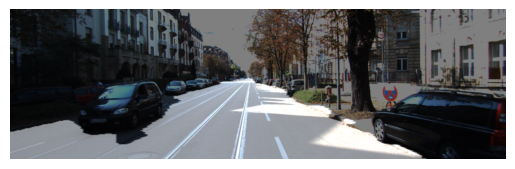

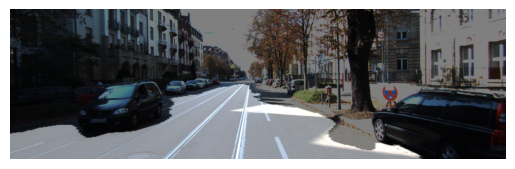

  3%|▎         | 1/30 [00:00<00:28,  1.03it/s]

IoU: 0.918356
IoU: 0.829949


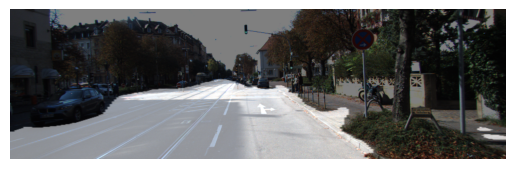

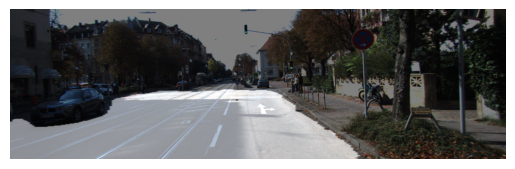

  7%|▋         | 2/30 [00:01<00:26,  1.04it/s]

IoU: 0.885848
IoU: 0.940078


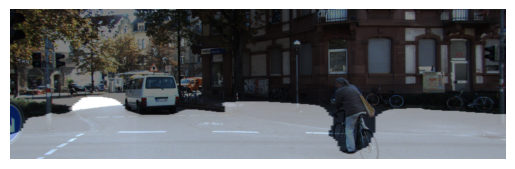

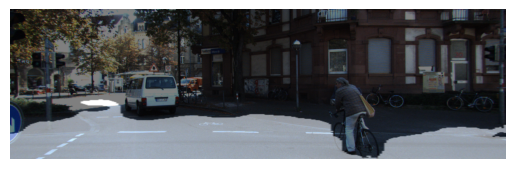

 10%|█         | 3/30 [00:03<00:27,  1.03s/it]

IoU: 0.671652
IoU: 0.765093


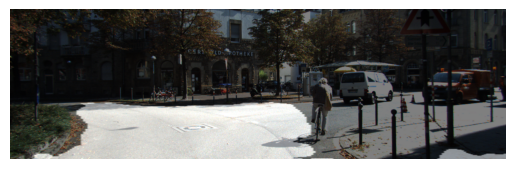

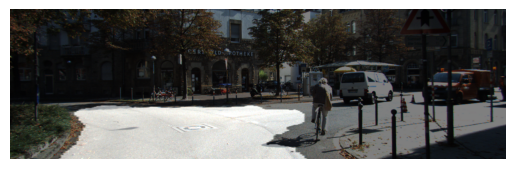

 13%|█▎        | 4/30 [00:04<00:26,  1.02s/it]

IoU: 0.722609
IoU: 0.680340


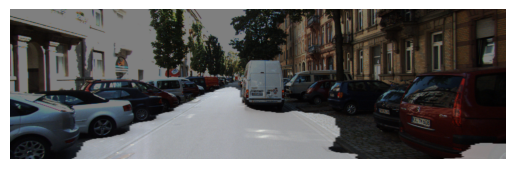

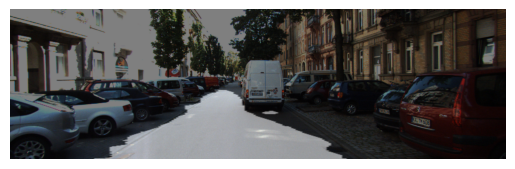

 17%|█▋        | 5/30 [00:05<00:25,  1.01s/it]

IoU: 0.723214
IoU: 0.831626


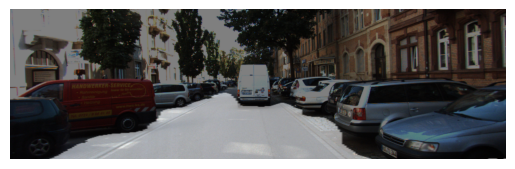

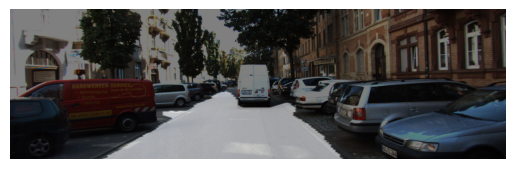

 20%|██        | 6/30 [00:06<00:24,  1.03s/it]

IoU: 0.737260
IoU: 0.912076


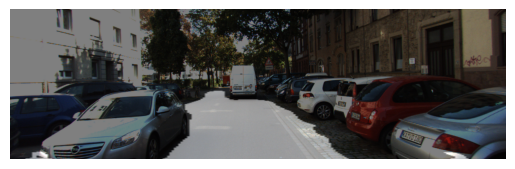

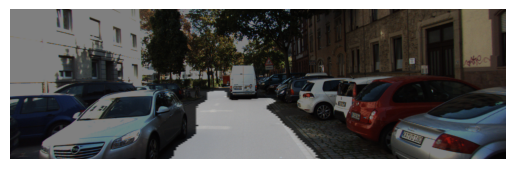

 23%|██▎       | 7/30 [00:07<00:23,  1.01s/it]

IoU: 0.764696
IoU: 0.856783


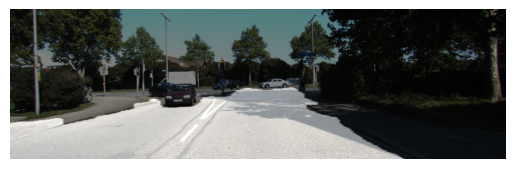

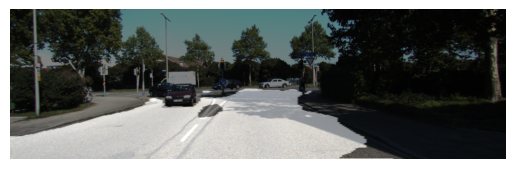

 27%|██▋       | 8/30 [00:08<00:21,  1.00it/s]

IoU: 0.895775
IoU: 0.884582


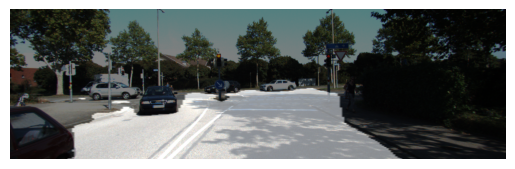

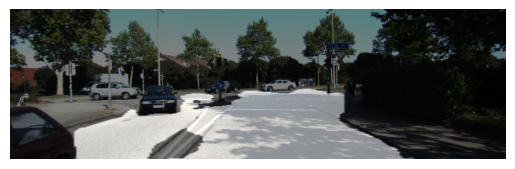

 30%|███       | 9/30 [00:08<00:20,  1.02it/s]

IoU: 0.878894
IoU: 0.830722


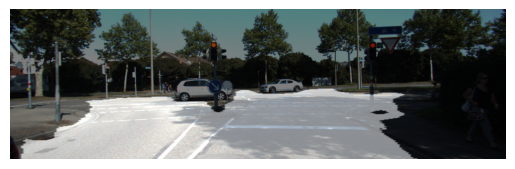

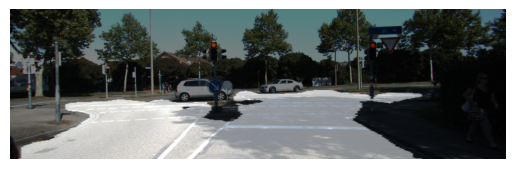

 33%|███▎      | 10/30 [00:09<00:19,  1.04it/s]

IoU: 0.847647
IoU: 0.888185


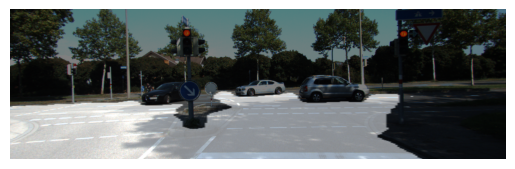

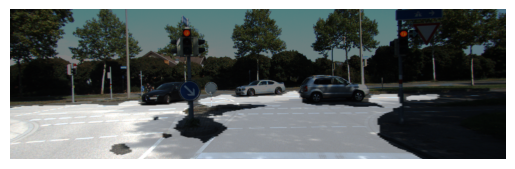

 37%|███▋      | 11/30 [00:10<00:18,  1.04it/s]

IoU: 0.824766
IoU: 0.829505


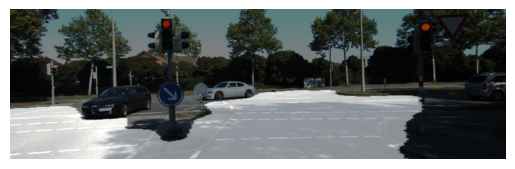

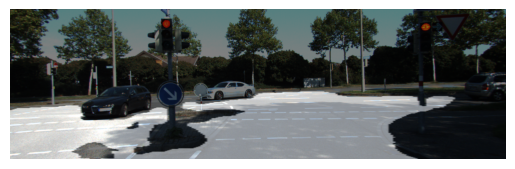

 40%|████      | 12/30 [00:11<00:17,  1.05it/s]

IoU: 0.791952
IoU: 0.854593


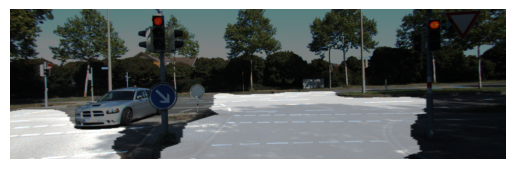

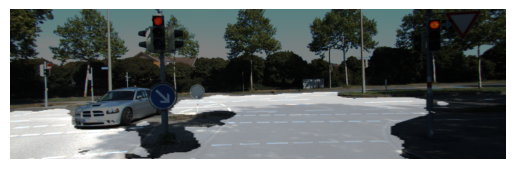

 43%|████▎     | 13/30 [00:12<00:16,  1.05it/s]

IoU: 0.732861
IoU: 0.820627


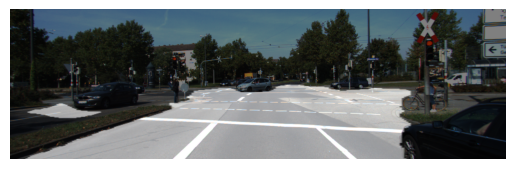

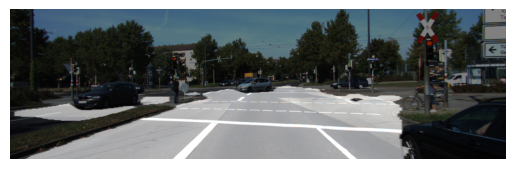

 47%|████▋     | 14/30 [00:13<00:15,  1.03it/s]

IoU: 0.857152
IoU: 0.855864


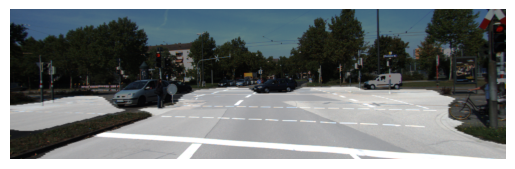

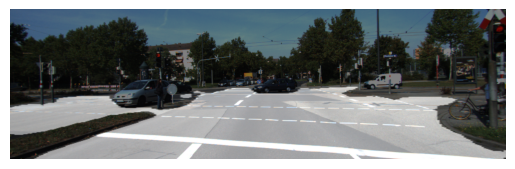

 50%|█████     | 15/30 [00:14<00:14,  1.01it/s]

IoU: 0.892829
IoU: 0.908627


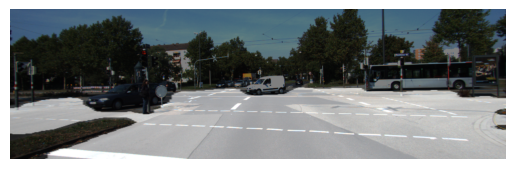

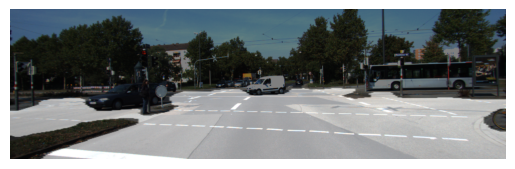

 53%|█████▎    | 16/30 [00:15<00:14,  1.01s/it]

IoU: 0.886704
IoU: 0.913115


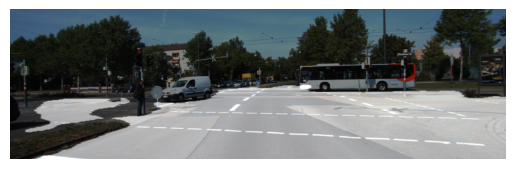

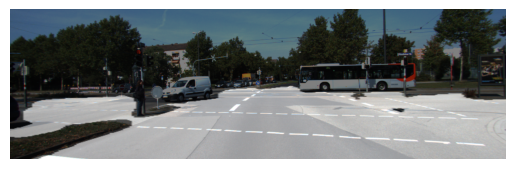

 57%|█████▋    | 17/30 [00:16<00:13,  1.02s/it]

IoU: 0.863331
IoU: 0.900579


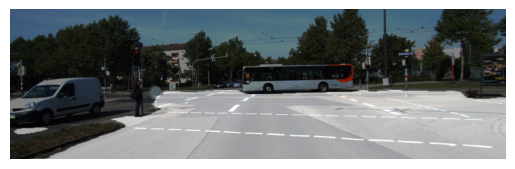

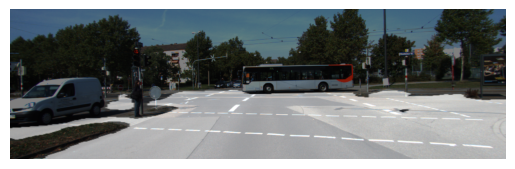

 60%|██████    | 18/30 [00:17<00:12,  1.05s/it]

IoU: 0.872415
IoU: 0.898205


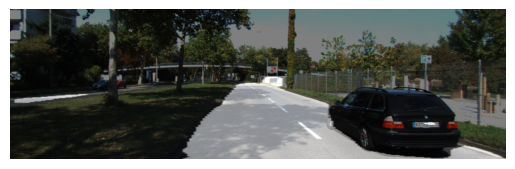

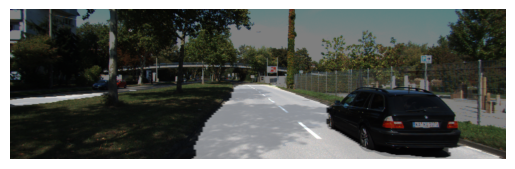

 63%|██████▎   | 19/30 [00:18<00:11,  1.02s/it]

IoU: 0.831494
IoU: 0.851810


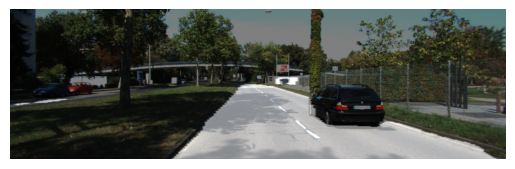

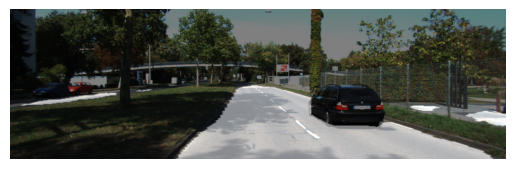

 67%|██████▋   | 20/30 [00:19<00:09,  1.00it/s]

IoU: 0.890373
IoU: 0.874681


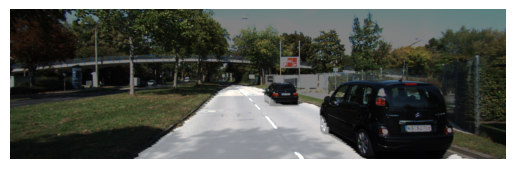

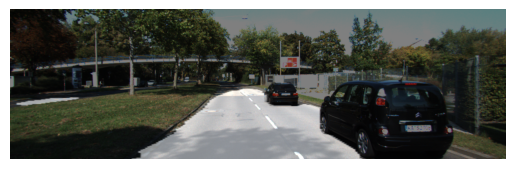

 70%|███████   | 21/30 [00:20<00:08,  1.02it/s]

IoU: 0.822641
IoU: 0.822368


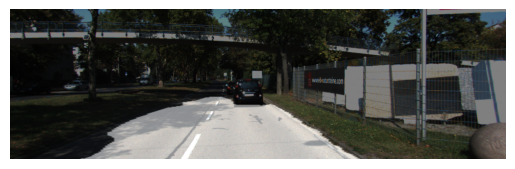

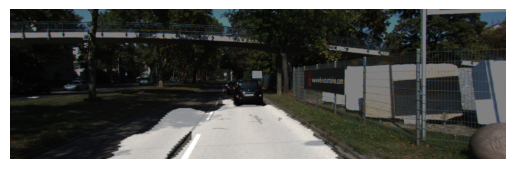

 73%|███████▎  | 22/30 [00:21<00:07,  1.01it/s]

IoU: 0.829588
IoU: 0.669428


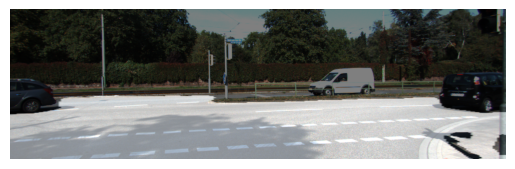

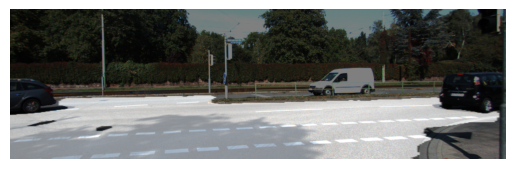

 77%|███████▋  | 23/30 [00:22<00:07,  1.00s/it]

IoU: 0.875052
IoU: 0.947434


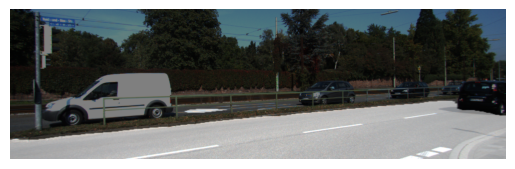

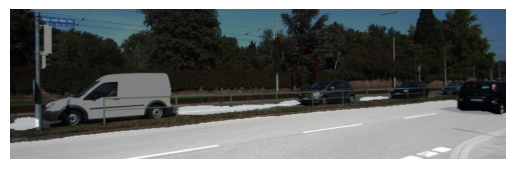

 80%|████████  | 24/30 [00:23<00:06,  1.01s/it]

IoU: 0.848261
IoU: 0.891509


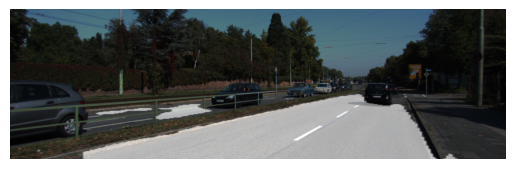

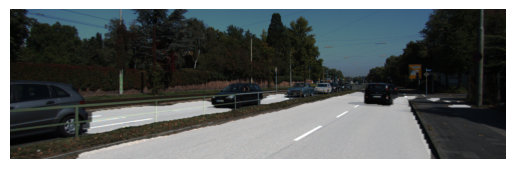

 83%|████████▎ | 25/30 [00:24<00:05,  1.02s/it]

IoU: 0.797658
IoU: 0.877400


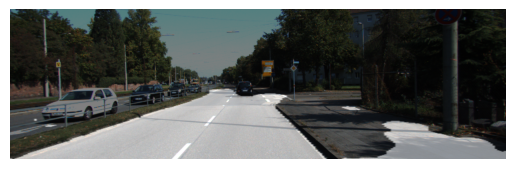

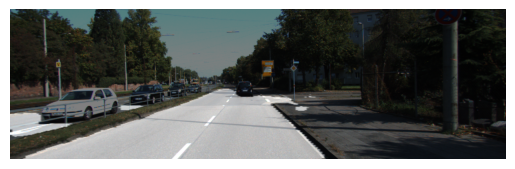

 87%|████████▋ | 26/30 [00:25<00:04,  1.02s/it]

IoU: 0.705959
IoU: 0.903498


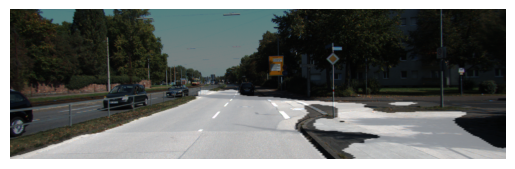

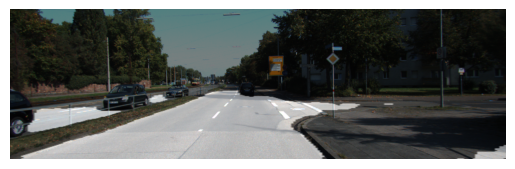

 90%|█████████ | 27/30 [00:27<00:03,  1.02s/it]

IoU: 0.557585
IoU: 0.824385


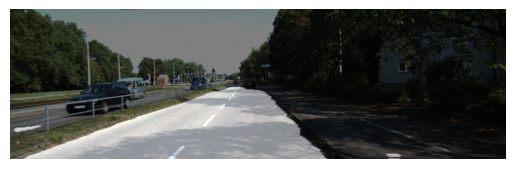

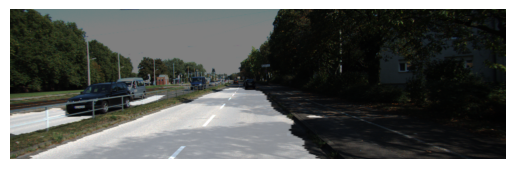

 93%|█████████▎| 28/30 [00:27<00:02,  1.01s/it]

IoU: 0.868224
IoU: 0.873574


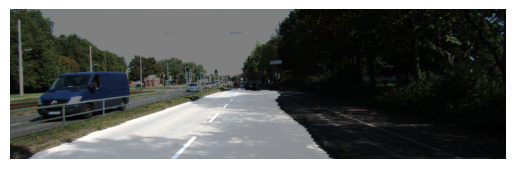

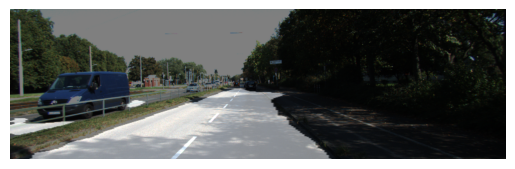

 97%|█████████▋| 29/30 [00:28<00:00,  1.02it/s]

IoU: 0.888224
IoU: 0.884284


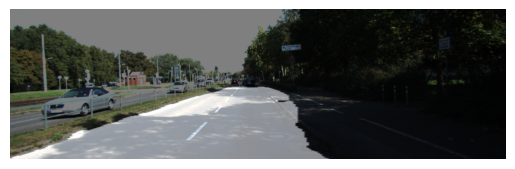

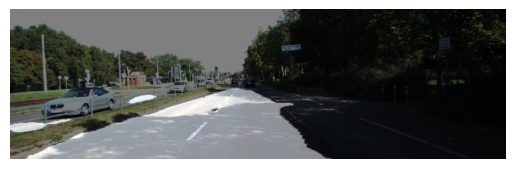

100%|██████████| 30/30 [00:29<00:00,  1.01it/s]

IoU: 0.851678
IoU: 0.865269

🏆 [최종 성능 비교 결과]
▶ U-Net    평균 IoU: 0.8178
▶ U-Net++  평균 IoU: 0.8562


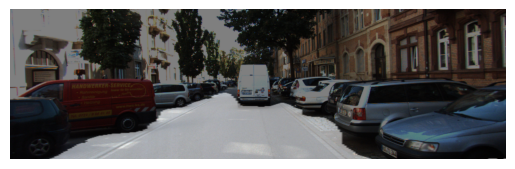

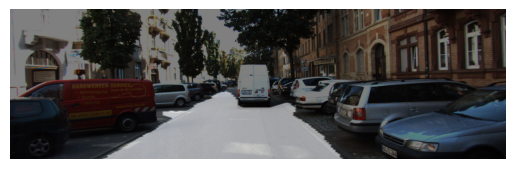

/tmp/ipykernel_91/2903428403.py:69: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_91/2903428403.py:69: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/opt/conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 51221 (\N{HANGUL SYLLABLE JEONG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/opt/conda/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 45813 (\N{HANGUL SYLLABLE DAB}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


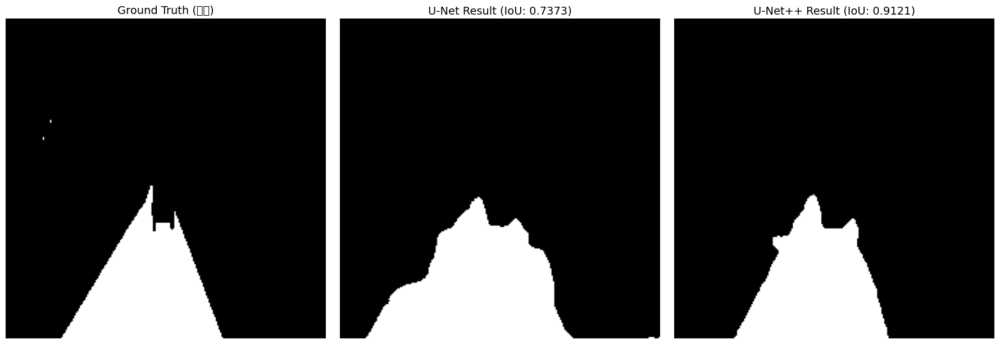

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # 진행률 표시를 위한 라이브러리

#  모델 준비 및 가중치 로드
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# U-Net 로드 (이미 학습된 가중치 파일 이름으로 변경하세요)
model = UNet(input_channels=3, output_channels=1).to(device)
model.load_state_dict(torch.load('./work/semantic_segmentation/seg_model_unet.pth', map_location=device))
model.eval()

# U-Net++ 로드 (방금 학습한 가중치 파일 이름으로 변경하세요)
model_unetplus = UNetPlusPlus(input_channels=3, num_classes=1).to(device)
model_unetplus.load_state_dict(torch.load('./work/semantic_segmentation/seg_model_unetplus.pth', map_location=device))
model_unetplus.eval()

# 정량적 분석
u_iou_list = []
up_iou_list = []

print("모든 테스트 데이터에 대한 점수 계산 중...")

# KittiDataset의 마지막 30장을 루프 돌립니다.
for i in tqdm(range(30)):
    # 데이터 경로 설정
    img_p = os.path.join(data_dir, f'image_2/{str(i).zfill(6)}_10.png')
    lab_p = os.path.join(data_dir, f'semantic/{str(i).zfill(6)}_10.png')

    # get_output 함수를 통해 예측값과 정답 마스크 추출
    _, pred_u, target = get_output(model, test_preproc, img_p, "tmp.png", lab_p)
    _, pred_up, _ = get_output(model_unetplus, test_preproc, img_p, "tmp.png", lab_p)

    # IoU 계산 (calculate_iou_score 함수 사용)
    u_iou_list.append(calculate_iou_score(target, pred_u/255.0))
    up_iou_list.append(calculate_iou_score(target, pred_up/255.0))

# 평균 성적
print("\n" + "="*30)
print(f"[최종 성능 비교 결과]")
print(f"▶ U-Net    평균 IoU: {np.mean(u_iou_list):.4f}")
print(f"▶ U-Net++  평균 IoU: {np.mean(up_iou_list):.4f}")
print("="*30)

# 정성적 분석
sample_idx = 5
img_p = os.path.join(data_dir, f'image_2/{str(sample_idx).zfill(6)}_10.png')
lab_p = os.path.join(data_dir, f'semantic/{str(sample_idx).zfill(6)}_10.png')

_, u_res, target = get_output(model, test_preproc, img_p, "u.png", lab_p)
_, up_res, _ = get_output(model_unetplus, test_preproc, img_p, "up.png", lab_p)

plt.figure(figsize=(18, 6))
plt.subplot(1, 3, 1)
plt.imshow(target, cmap='gray'); plt.title("Ground Truth (정답)", fontsize=14); plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(u_res, cmap='gray');
plt.title(f"U-Net Result (IoU: {u_iou_list[sample_idx]:.4f})", fontsize=14); plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(up_res, cmap='gray');
plt.title(f"U-Net++ Result (IoU: {up_iou_list[sample_idx]:.4f})", fontsize=14); plt.axis('off')

plt.tight_layout()
plt.show()